# Binned development

Minimum lot size requirements vary by zoning district in Waltham. This investigation visualizes the distribution of residential parcel lot sizes (binned to the nearest 500 sq ft) to understand what share of parcels would conform to typical minimums. This is the first step toward modeling what the city would look like if non-conforming lots were required to merge.

In [1]:
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm
import pandas as pd

from investigations.neighborhood_character.fetch import (
    fetch_residential_lot_sizes,
    fetch_parcel_geometry,
)

df = fetch_residential_lot_sizes()

In [2]:
print(f"Residential parcels with recorded lot size: {len(df):,}")
print(f"Min lot size:    {df['LOT_SIZE_SQFT'].min():,.0f} sq ft")
print(f"Median lot size: {df['LOT_SIZE_SQFT'].median():,.0f} sq ft")
print(f"Max lot size:    {df['LOT_SIZE_SQFT'].max():,.0f} sq ft")
print(f"Modal bin:       {df['lot_size_bin'].mode().iloc[0]:,.0f} sq ft")

Residential parcels with recorded lot size: 11,212
Min lot size:    871 sq ft
Median lot size: 6,970 sq ft
Max lot size:    2,701,156 sq ft
Modal bin:       5,000 sq ft


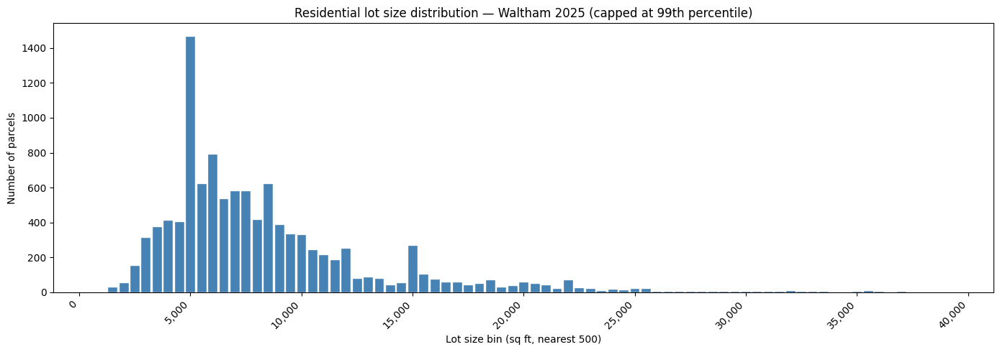

In [3]:
# Cap at 99th percentile to keep the common range readable
p99 = df['LOT_SIZE_SQFT'].quantile(0.99)
plot_df = df[df['LOT_SIZE_SQFT'] <= p99].copy()

bin_counts = (
    plot_df.groupby("lot_size_bin")
    .size()
    .reset_index(name="count")
    .sort_values("lot_size_bin")
)

fig, ax = plt.subplots(figsize=(14, 5))
ax.bar(
    bin_counts["lot_size_bin"],
    bin_counts["count"],
    width=450,
    color="steelblue",
    edgecolor="white",
)
ax.set_xlabel("Lot size bin (sq ft, nearest 500)")
ax.set_ylabel("Number of parcels")
ax.set_title("Residential lot size distribution — Waltham 2025 (capped at 99th percentile)")
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [4]:
all_parcels = fetch_parcel_geometry()

# Join lot size bins onto geometry; parcels with no assessment record get no fill
map_gdf = all_parcels.merge(
    df[["LOC_ID", "LOT_SIZE_SQFT", "lot_size_bin", "SITE_ADDR", "UNITS"]],
    on="LOC_ID",
    how="left",
).to_crs(epsg=4326)

map_gdf["lot_size_bin_str"] = map_gdf["lot_size_bin"].apply(
    lambda x: f"{x:,.0f}" if pd.notna(x) else "n/a"
)

# Color scale: light yellow → dark blue, capped at the 95th percentile of bins
vmax = df["lot_size_bin"].quantile(0.95)
colormap = cm.LinearColormap(
    colors=["#ffffcc", "#41b6c4", "#253494"],
    vmin=0,
    vmax=vmax,
    caption="Lot size bin (sq ft)",
)

def style_fn(feature):
    val = feature["properties"].get("lot_size_bin")
    if val is None or pd.isna(val):
        return {"fillColor": "#cccccc", "color": "white", "weight": 0.3, "fillOpacity": 0.4}
    return {
        "fillColor": colormap(min(val, vmax)),
        "color": "white",
        "weight": 0.3,
        "fillOpacity": 0.75,
    }

bounds = map_gdf.total_bounds
center_lat = (bounds[1] + bounds[3]) / 2
center_lon = (bounds[0] + bounds[2]) / 2

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=14,
    tiles=None,
    max_bounds=True,
    min_lat=bounds[1] - 0.01,
    max_lat=bounds[3] + 0.01,
    min_lon=bounds[0] - 0.01,
    max_lon=bounds[2] + 0.01,
)
folium.TileLayer("CartoDB positron", control=False).add_to(m)

folium.GeoJson(
    map_gdf,
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(
        fields=["SITE_ADDR", "LOT_SIZE_SQFT", "lot_size_bin_str", "UNITS"],
        aliases=["Address", "Lot size (sq ft)", "Bin (sq ft)", "Units"],
    ),
    name="Lot size by parcel",
).add_to(m)

colormap.add_to(m)
folium.LayerControl().add_to(m)

m.save("published/lot_size_clustering.html")
m